In [1]:

from torchvision.ops import batched_nms
%load_ext autoreload
%autoreload 2

import sys
import os
import matplotlib.patches as patches
sys.path.append(".")

from Models.splinedist import *
import pytorch_lightning as pl
import torch
from Datasets.CISD import *
from Datasets.DSB18 import * 
from torchvision import io
import glob

In [2]:
# !pip install rasterio

In [3]:
# # pl.seed_everything(47)
# data = CISD_datamodule(path="Datasets/CISD/CISD.json", root="Datasets/CISD/center_slice", contourSize=500)
# batch_x, batch_y = next(iter(data.val_dataloader()))
# showBatch((batch_x, batch_y))
# !pip install shapely
def generateSamples(objprob, threshold=0.1, num_samples=100, height=256, width=256):
    ""
    objprob = objprob * (objprob > threshold)
    distribution = objprob / objprob.sum()

    distribution = distribution.flatten().cpu()
    cum_objprop_t = np.cumsum(distribution)

    coordinates_x = []
    coordinates_y = []
    # map uniform samples to pixels
    for i, z in enumerate(np.random.uniform(size=num_samples)):
        diff = cum_objprop_t - z

        mask = np.ma.less_equal(diff, 0)
        masked_diff = np.ma.masked_array(diff, mask)

        # position in 1D-array where x is closest but greater than array value
        min_pos = masked_diff.argmin()

        # retrieve pixel coordinates
        x = min_pos % width
        y = min_pos // height

        coordinates_x.append(x)
        coordinates_y.append(y)

    return coordinates_x, coordinates_y

# Evaluation on the Dataset

In [4]:
modelName = "Experiments/Models_final21/weights/splineDist-CISD10-epoch=382-loss_val=3.94.ckpt"
# modelName = "Experiments/Models_final21/weights/splineDist-CISD10-epoch=231-loss_val=4.91.ckpt"
# modelName = "Experiments/Models_final2/weights/splineDist-CISD4-epoch=86-loss_val=0.08.ckpt"
model = SplineDist.load_from_checkpoint(
    checkpoint_path=modelName)
device = "cuda:4"

# Evaluation on costum images

('cuda:4',) {}
inferenceCISD/0239_AY_01073.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 166.68it/s]


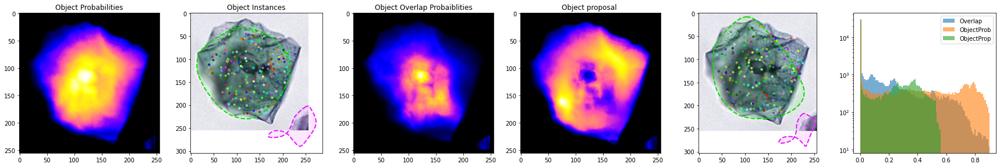

inferenceCISD/0231_K_00990.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 113.05it/s]


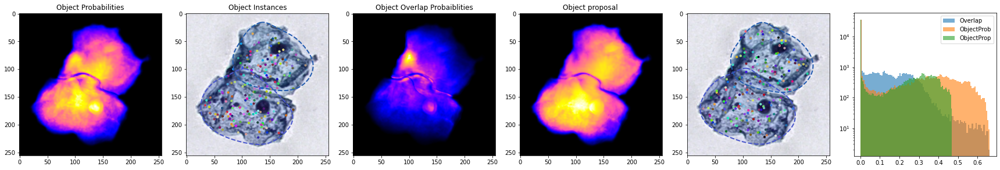

inferenceCISD/0231_K_00965.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 146.55it/s]


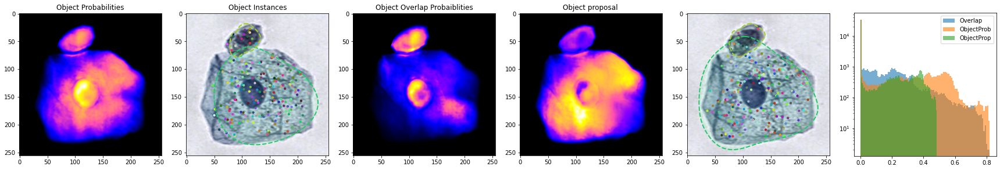

inferenceCISD/0236_BD_01639.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 126.16it/s]


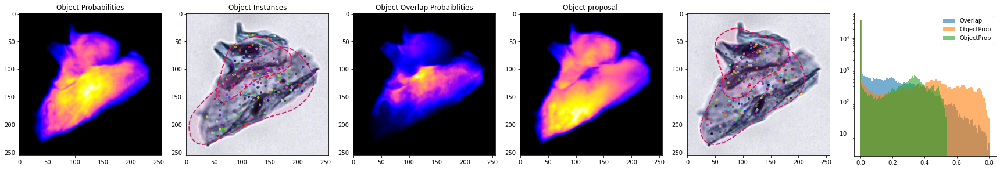

inferenceCISD/0242_BB_01116.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 115.90it/s]


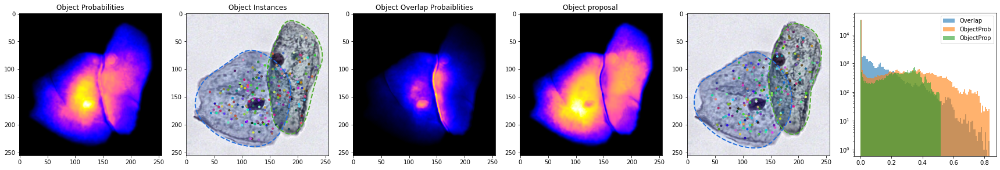

inferenceCISD/0239_AY_00996.jpg


100%|█████████████████████████████████████████| 200/200 [00:02<00:00, 91.68it/s]


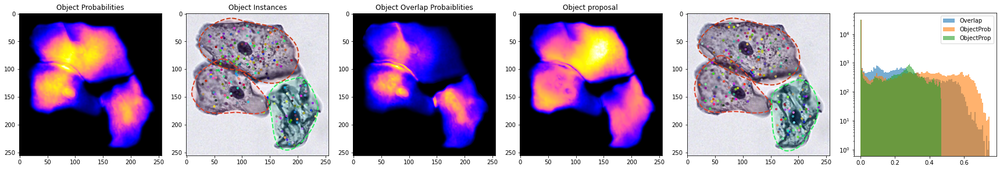

inferenceCISD/0231_K_00957.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 126.20it/s]


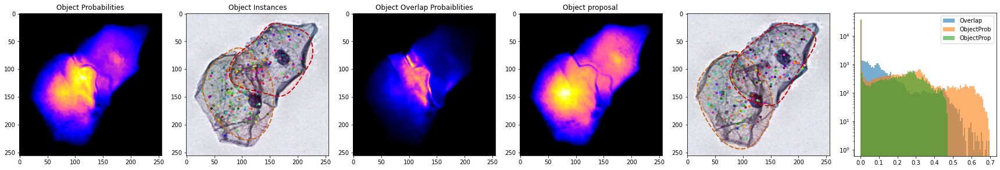

inferenceCISD/0231_K_00972.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 107.78it/s]


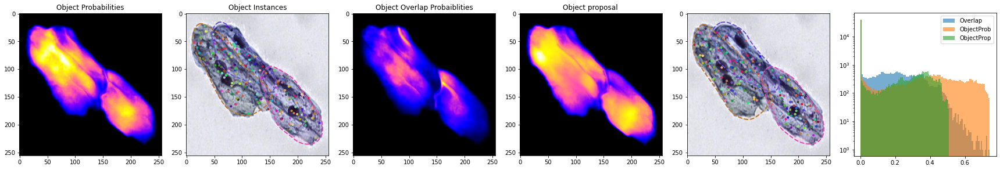

inferenceCISD/0239_AY_00962.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 114.78it/s]


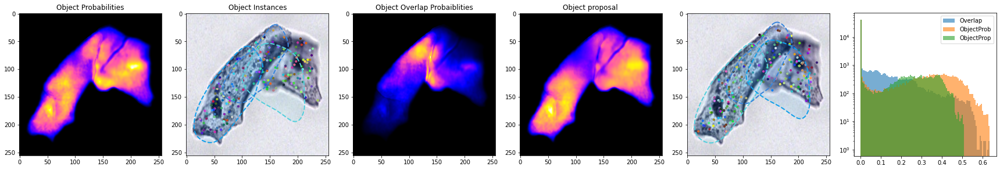

inferenceCISD/0232_BC_00962.jpg


100%|█████████████████████████████████████████| 200/200 [00:02<00:00, 95.40it/s]


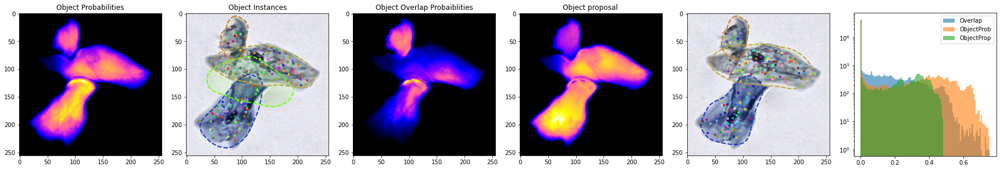

inferenceCISD/0231_K_00998.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 132.88it/s]


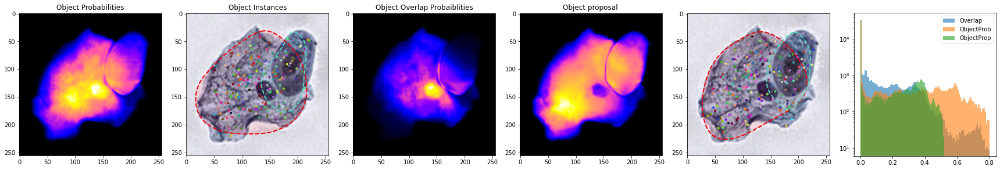

inferenceCISD/0241_BB_01529.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 129.00it/s]


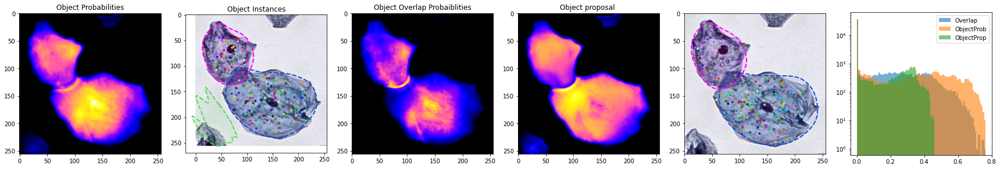

inferenceCISD/0250_AT_01856.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 158.20it/s]


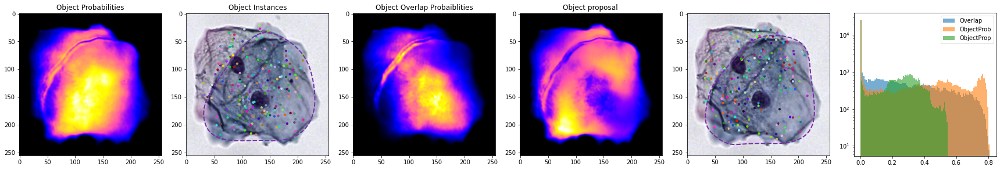

inferenceCISD/0250_AT_01665.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 113.81it/s]


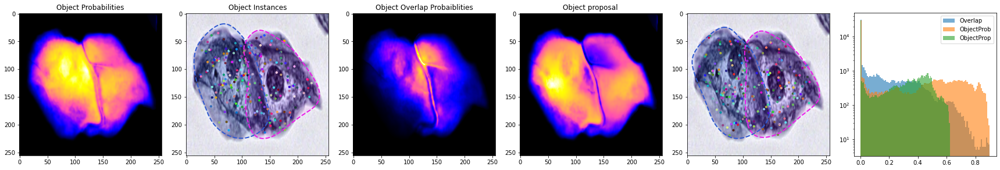

inferenceCISD/0231_K_00956.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 125.29it/s]


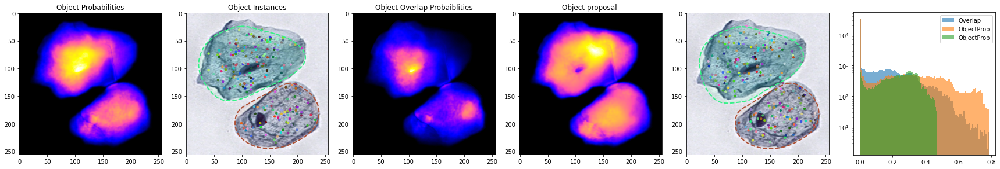

inferenceCISD/0231_K_00963.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 120.18it/s]


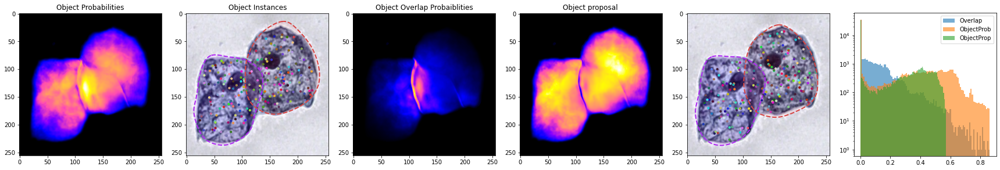

inferenceCISD/0234_BC_00712.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 123.26it/s]


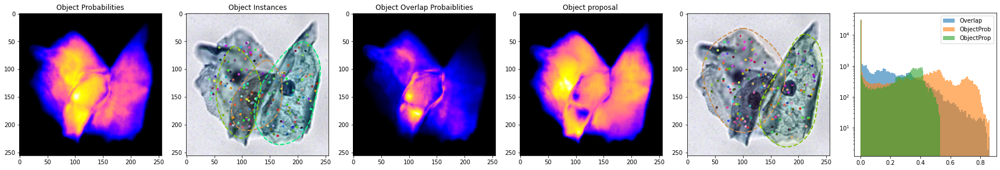

inferenceCISD/0239_AY_00545.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 163.66it/s]


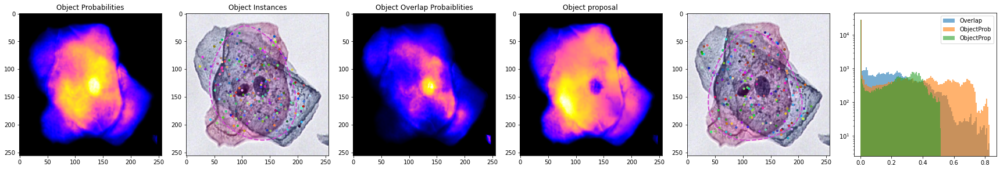

inferenceCISD/0231_K_00983.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 117.01it/s]


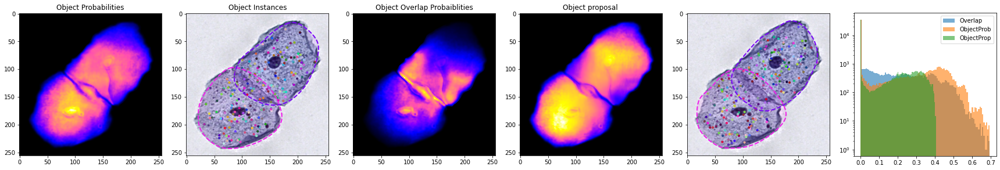

inferenceCISD/0235_BD_01202.jpg


100%|█████████████████████████████████████████| 200/200 [00:02<00:00, 89.82it/s]


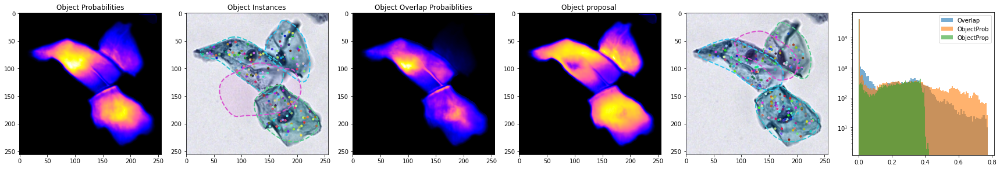

inferenceCISD/0231_K_00971.jpg


100%|█████████████████████████████████████████| 200/200 [00:02<00:00, 76.91it/s]


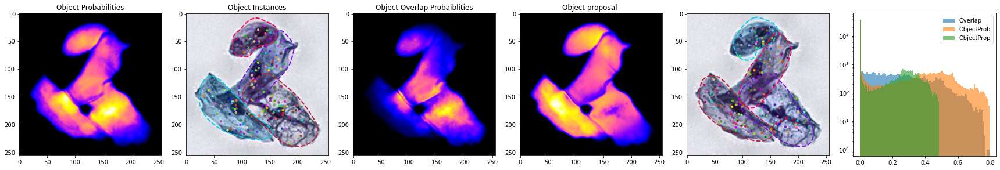

inferenceCISD/0231_K_00944.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 102.38it/s]


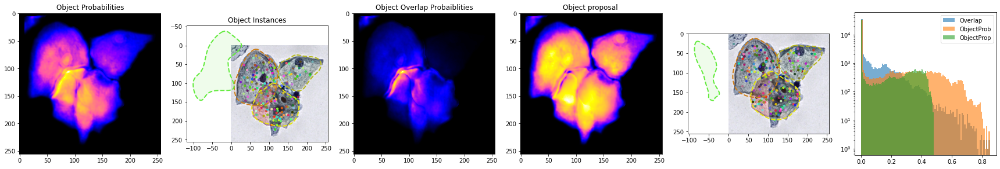

inferenceCISD/0254_AS_01684.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 120.38it/s]


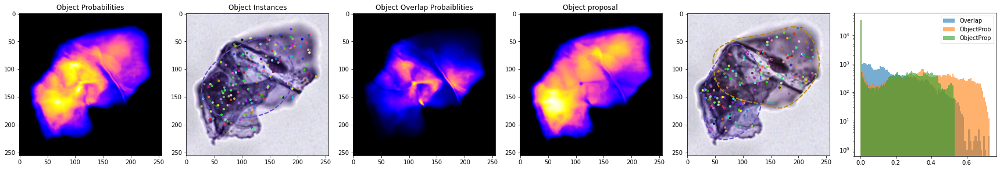

inferenceCISD/0239_AY_01215.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 115.22it/s]


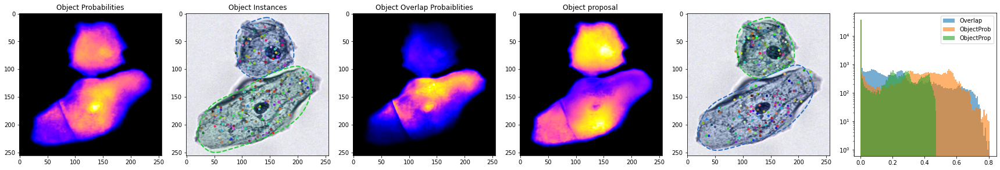

inferenceCISD/0254_AS_01362.jpg


100%|█████████████████████████████████████████| 200/200 [00:02<00:00, 80.26it/s]


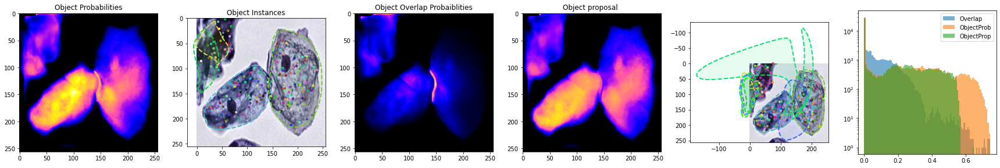

inferenceCISD/0231_K_00982.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 121.68it/s]


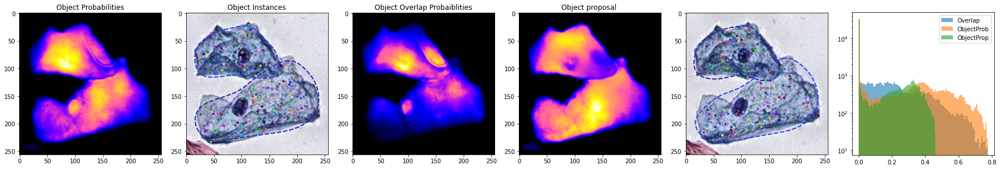

inferenceCISD/0231_K_00953.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 120.34it/s]


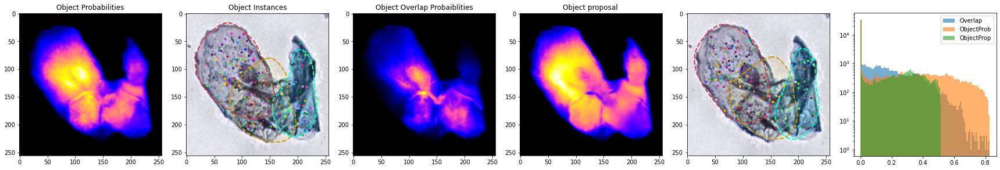

inferenceCISD/0231_K_00942.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 131.90it/s]


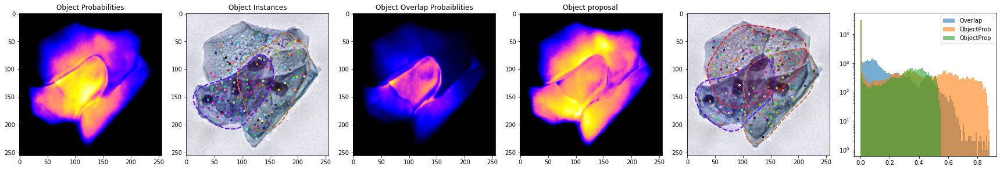

inferenceCISD/0246_BE_01052.jpg


100%|█████████████████████████████████████████| 200/200 [00:02<00:00, 78.91it/s]


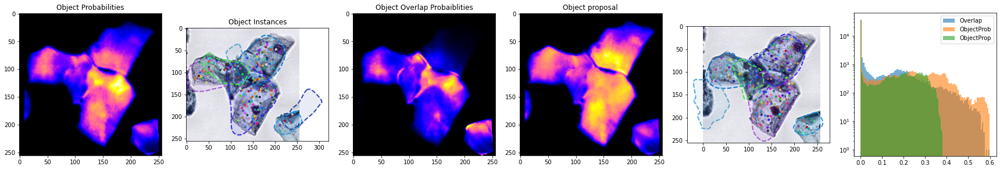

inferenceCISD/0231_K_00977.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 117.15it/s]


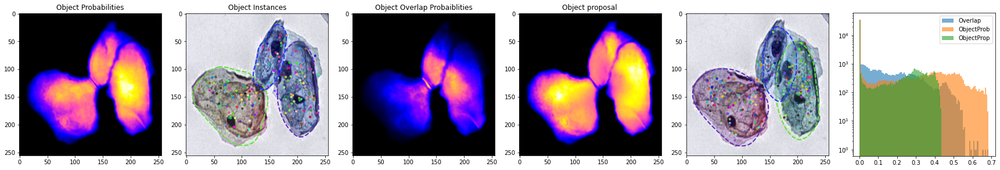

inferenceCISD/0243_BB_01138.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 132.78it/s]


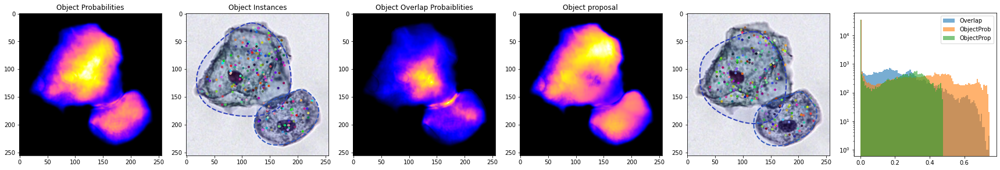

inferenceCISD/0254_AS_01149.jpg


100%|████████████████████████████████████████| 200/200 [00:01<00:00, 156.01it/s]


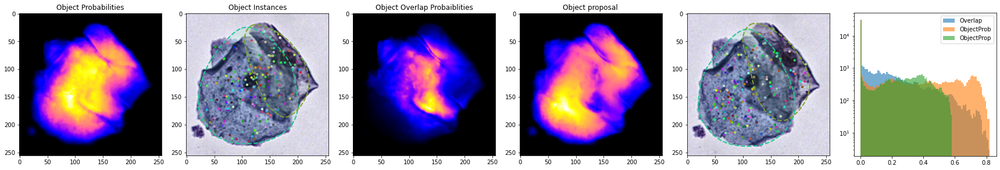

In [5]:
transforms = get_transforms(0.5, 0.5)

# model = model.to(device)
model = model.to(device)
MAX_CONTOUR_SIZE = model.MAX_CONTOUR_SIZE
threshold = 0.1
nms_threshold = 0.3
num_samples = 200
# MAX_CONTOUR_SIZE = 500
for image in glob.glob("inferenceCISD/*.jpg"):
    print(image)
    img = io.read_image(image, io.ImageReadMode.RGB).float()/255
    img = transforms(img).unsqueeze(0)
    img = img.to(device)
    model.eval()

    with torch.no_grad():
        (objectProbas, angles, distances, controlPoints, objectOverlap) = model(img)
        objectProbas = torch.sigmoid(objectProbas)
        objectOverlap = torch.sigmoid(objectOverlap)
        contours = getContourSamples(controlPoints, model.B3M).permute(1, 2, 3, 0, 4)
#         contours = contours.reshape(-1, MAX_CONTOUR_SIZE, 2)
        
                
        overlap = objectOverlap[0, 0].detach()
        overlap = (overlap - overlap.min())/(overlap.max() - overlap.min())#splineDist-CISD10-epoch=339-loss_val=4.45.ckpt
        objprob = objectProbas[0, 0].detach()
        overlap = objprob.max()*overlap
#         objprob = (objprob - objprob.min())/(objprob.max() - objprob.min())
        objprop = objprob * (1 - overlap)
        

        coordinates_x, coordinates_y = generateSamples(objprob, threshold, num_samples)
        coordinates_x2, coordinates_y2 = generateSamples(objprop, threshold, num_samples)
        

        xmin = torch.amin(contours[:, :, 1], dim=-1) 
        xmax = torch.amax(contours[:, :, 1], dim=-1)
        ymin = torch.amin(contours[:, :, 0], dim=-1)
        ymax = torch.amax(contours[:, :, 0], dim=-1)

#         bboxes = torch.stack([xmin, ymin, xmax, ymax], -1)
#         bboxes0 = torch.stack([xmin, ymin, xmax, ymax], -1)
        
#         scores = objprop.reshape(256*256)

#         bboxes = bboxes[scores>threshold]
#         scores2 = scores[scores>threshold]

#         selectedIds = batched_nms(bboxes, scores2, torch.ones(len(scores2)), iou_threshold=nms_threshold)

#         bboxes = bboxes.detach().cpu().numpy()
#         selectedIds = selectedIds.detach().cpu().numpy()

#         rects = bboxes[selectedIds]
        
        
#         scores3 = objprob.reshape(256*256)

#         bboxes = bboxes0[scores3>threshold]
#         scores4 = scores[scores3>threshold]

#         selectedIds2 = batched_nms(bboxes, scores4, torch.ones(len(scores4)), iou_threshold=nms_threshold)

#         bboxes = bboxes.detach().cpu().numpy()
#         selectedIds2 = selectedIds2.detach().cpu().numpy()

#         rects2 = bboxes[selectedIds2]
        
        

        # polygon IOU
        
        
        samples = tuple(zip(coordinates_y, coordinates_x))
        scores = objprob[coordinates_y, coordinates_x].cpu().detach().numpy()
        scores2 = objprop[coordinates_y2, coordinates_x2].cpu().detach().numpy()
        contours_prob = contours[0, coordinates_y, coordinates_x, :, :].cpu()
        contours_prop = contours[0, coordinates_y2, coordinates_x2, :, :].cpu()
        
#         scores = objectProbas[0].flatten(1).cpu().detach().numpy()
#         sortedInstances = np.argsort(scores).copy()

#         til = [np.searchsorted(scores[0, sortedInstances[0]], threshold)]

#         contours2 = [contours[til[0]:]]
#         print(til)
#         print(len(contours2[0]))
#         postProcessed = nonMaximumSuppresion(scores[0, sortedInstances[0, til[0]:]],
#                                             contours2[0],
#                                             threshold,
#                                             nms_threshold)
        contoursSelected, selectedIds = nonMaximumSuppresion(scores,
                                             contours_prob,
                                             threshold*2,
                                             nms_threshold)
        selectedIds = np.array(selectedIds)
        
        
        contoursSelected, selectedIds2 = nonMaximumSuppresion(scores2,
                                             contours_prop,
                                             threshold,
                                             nms_threshold,
                                             overlap=overlap.cpu().numpy())

        selectedIds2 = np.array(selectedIds2)

        
        # end of the non maximum suppression
        
        
        
        image = np.ones((256,256,3), np.uint8)*255
        image2 = np.uint8(denormalize(img[0].detach().cpu()).numpy().transpose(1, 2, 0)*255)
        
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
   
    
    #     image2 = clahe.apply(image2)
        img_yuv = cv2.cvtColor(image2, cv2.COLOR_RGB2YUV)

        # equalize the histogram of the Y channel
        img_yuv[:,:,0] = clahe.apply(img_yuv[:,:,0])

        # convert the YUV image back to RGB format
        image2 = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
        
    #     image2 = cv2.equalizeHist(image2)
#         ctrs = contours[scores>threshold][selectedIds].detach().cpu().numpy()
#         ctrs2 = contours[scores3>threshold][selectedIds2].detach().cpu().numpy()
        ctrs = contours_prob[selectedIds].detach().cpu().numpy()
        ctrs2 = contours_prop[selectedIds2].detach().cpu().numpy()

        fig, (ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(
                    1, 6, figsize=(24, 4))
        

        ax7.hist(overlap.cpu().numpy().reshape(-1), 100, alpha=0.6, label="Overlap")
        ax7.hist(objprob.cpu().numpy().reshape(-1), 100, alpha=0.6, label="ObjectProb")
        ax7.hist(objprop.cpu().numpy().reshape(-1), 100, alpha=0.6, label="ObjectProp")
        ax7.set_yscale('log')
        ax7.legend()
        
        ax4.set_title("Object Overlap Probaiblities")
        ax4.imshow(overlap.cpu(), cmap='gnuplot2')
        
        ax5.set_title("Object proposal ")
        ax5.imshow(objprop.cpu(), cmap='gnuplot2')
        

        
        ax2.set_title("Object Probabilities")
        # print(objectProbas.min(), objectProbas.max(), objectProbas.ptp())
        ax2.imshow(objprob.cpu(), cmap='gnuplot2')
        # plt.subplot(1,4,4)
        ax3.set_title("Object Instances")
        # instances, colors = getInstancesImageFromContours(objectContours)
        #ax4.imshow(denormalize(img[0]).cpu().numpy().transpose(1, 2, 0))
        ax3.imshow(image2)
        ax3.scatter(coordinates_x, coordinates_y, c=np.random.rand(len(coordinates_x),3), s=10)
        # ax4.imshow(instances, alpha=0.3)
        colors = [ list(map(lambda x: x/255, getRandomColor())) for j in range(num_samples)]

        for j, ct in enumerate(ctrs):
            ax3.fill(ctrs[j][:, 0], ctrs[j][:, 1], color=colors[j], alpha=0.1)
            ax3.plot(ctrs[j][:, 0], ctrs[j][:, 1], color=colors[j], linewidth=2, linestyle='dashed')
            
            
        ax6.imshow(image2)
        # ax4.imshow(instances, alpha=0.3)
#         colors = [ list(map(lambda x: x/255, getRandomColor())) for j in range(len(contours))]
        ax6.scatter(coordinates_x2, coordinates_y2, c=np.random.rand(len(coordinates_x),3), s=10)
        for j, ct in enumerate(ctrs2):
            ax6.fill(ctrs2[j][:, 0], ctrs2[j][:, 1], color=colors[j], alpha=0.1)
            ax6.plot(ctrs2[j][:, 0], ctrs2[j][:, 1], color=colors[j], linewidth=2, linestyle='dashed')

        fig.tight_layout()
        plt.show()
            


In [ ]:
plt.imshow((overlap.cpu()>0.8))

In [7]:
len(scores)

200

In [9]:
len(coordinates_x)

200

In [18]:
objprob.cpu().numpy().shape

(256, 256)